In [11]:
 cd "/Users/troydo42/Desktop/Body_Matrixes/samples"

/Users/troydo42/Desktop/Body_Matrixes/samples


In [71]:
### Load Video and Display sample Frame
import os
import av
import math
import random
from torchvision.io import read_video
from torchvision.transforms.functional import to_pil_image

def load_video(video_path, rotate, index):
    video, audio, meta = read_video(video_path, pts_unit="sec", output_format="TCHW")
    frame_counts = len(video)
    fps = meta['video_fps']
    print(frame_counts, fps)
    sample_index = index
    sample_frame = to_pil_image(video[sample_index])
    sample_frame = sample_frame.rotate(rotate, expand=True)
    return video, frame_counts, fps, sample_frame

83 29.88


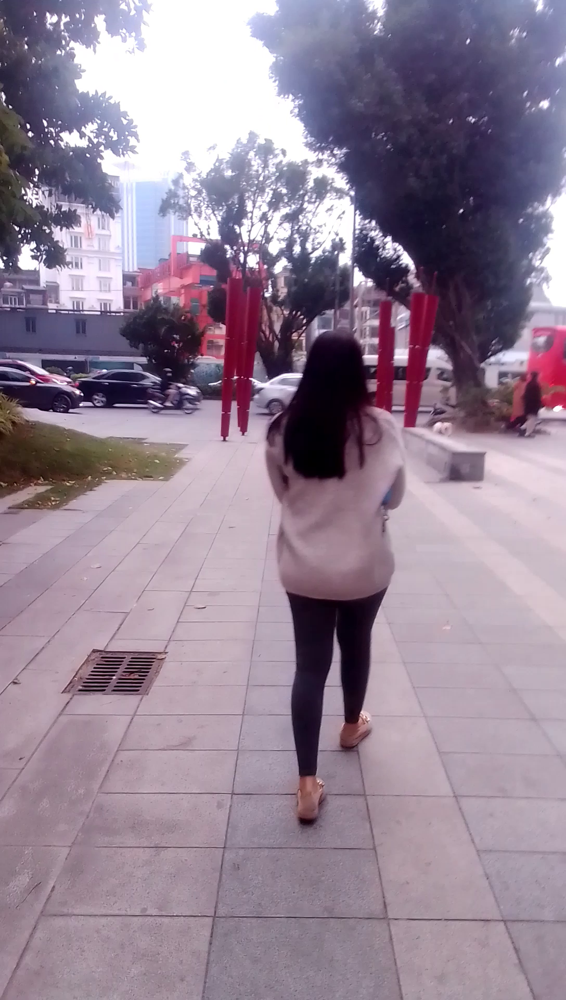

In [205]:
right_vid, right_counts, right_fps, right_sample = load_video("sample02.mp4", -90, 10)
right_sample

83 29.88


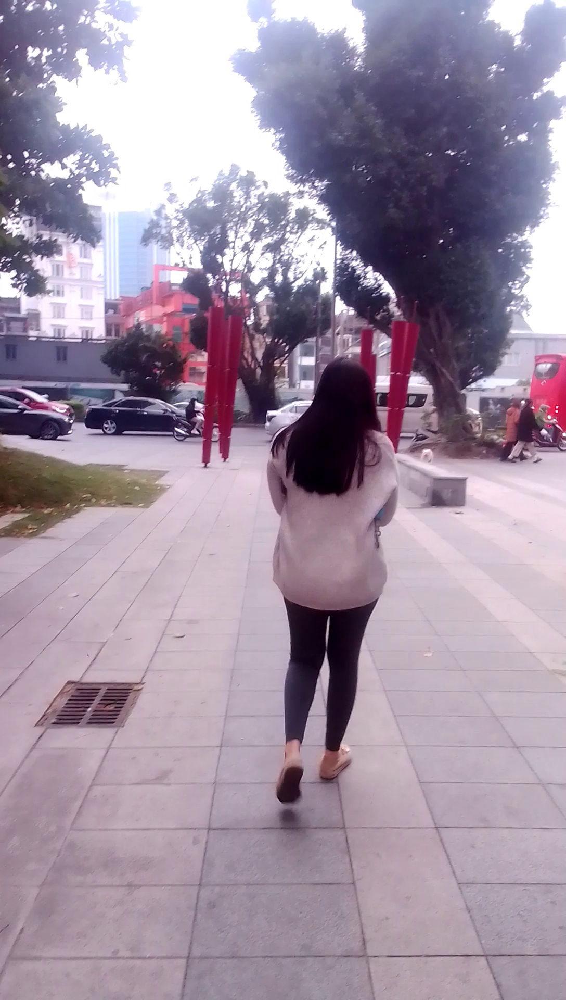

In [208]:
left_vid, left_counts, left_fps, left_sample = load_video("sample02.mp4", -90,18)
left_sample

In [209]:
### Load Keypoints Model on Sample

from torchvision.models.detection import keypointrcnn_resnet50_fpn, KeypointRCNN_ResNet50_FPN_Weights

weights = KeypointRCNN_ResNet50_FPN_Weights.COCO_V1
model =  keypointrcnn_resnet50_fpn(weights=weights)
transforms = weights.transforms()

model.eval().to("cpu")

KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.

In [210]:
from PIL import ImageDraw, ImageFont

min_accuracy = 0.9
font = "/Users/troydo42/Desktop/Body_Matrixes/Roboto-Bold.ttf"
marker_font = ImageFont.truetype(font, 8)

def center(bbox):
    center_x = (bbox[2] + bbox[0])/2
    center_y = (bbox[3] + bbox[1])/2
    center = [center_x, center_y]
    return center

def dfc(pic, bbox):
    pic_width = pic.width
    pic_height = pic.height
    
    pic_center = center([0,0, pic_width, pic_height])
    bbox_center = center(bbox)
    
    x_dif = bbox_center[0] - pic_center[0]
    y_dif = bbox_center[1] - pic_center[1]
    bbox_width = bbox[2] - bbox[0]
    bbox_height = bbox[3] - bbox[1] 
    distance = math.sqrt(x_dif * x_dif + y_dif * y_dif)
    area = abs(bbox_width * bbox_height)
    return distance, area

def getSHAPositions(kp):
    ls = kp[0][5]
    rs = kp[0][6]

    lh = kp[0][11]
    rh = kp[0][12]

    la = kp[0][15]
    ra = kp[0][16]
    
    points = [
        [ls[0].item(), ls[1].item()],
        [rs[0].item(), rs[1].item()],
        [lh[0].item(), lh[1].item()], 
        [rh[0].item(), rh[1].item()], 
        [la[0].item(), la[1].item()], 
        [ra[0].item(), ra[1].item()]
    ]
    
    return points

def drawMarkers(labels, coordinates, image):
    sample = image.copy()
    draw = ImageDraw.Draw(sample) 
            
    for index, point in zip(labels, coordinates):
        label = index 
        radius = 6

        draw.ellipse(
            [(point[0]-radius, point[1]-radius), (point[0]+radius, point[1]+radius)],
            fill="#40389F",
            outline="#ffffff",
            width=1
        )

        draw.text(
            (point[0]-3, point[1]-6),
            str(label),
            fill="#FAFF00",
            font=marker_font,
            align="center"
        )
    return sample
    
def detect(frame):
    ### Make Predictions on Frame
    body_matrix = transforms(frame)
    predictions = model([body_matrix.to("cpu")])
    
    ### Extract Boxes, Scores and Keypoints from frame
    boxes = predictions[0]['boxes']
    keypoints = predictions[0]['keypoints']
    scores = predictions[0]['scores']
    
    ### Filter for the main Bounding Box and Keypoints
    idx = torch.where(scores > min_accuracy)
    main_boxes = torch.unsqueeze(boxes[idx], dim=1)
    index = 0
    max_area = 0
    max_distance = frame.width/3

    for selector, box in enumerate(main_boxes):
        bbox = [
            box[0][0].item(), 
            box[0][1].item(),
            box[0][2].item(),
            box[0][3].item()
        ]
        
        distance, area = dfc(frame, bbox) 
        if distance < max_distance and area > max_area:
            max_area = area
            index = selector
            # print("Selected", area, selector, distance)
        # else:
            # print("Not selected", area, selector, distance)
            
    bx = torch.unsqueeze(boxes[idx][index], dim=0)
    kp = torch.unsqueeze(keypoints[idx][index], dim=0)
    SHApoints = getSHAPositions(kp)
    labels = ["ls","rs","lh","rh","la","ra"]
    points_image = drawMarkers(labels, SHApoints, frame)
    
    return points_image, SHApoints

[[544.615478515625, 846.7192993164062], [734.6489868164062, 865.4146118164062], [574.8480834960938, 1111.328857421875], [685.7009887695312, 1115.6431884765625], [563.3308715820312, 1437.7764892578125], [639.6322021484375, 1452.157470703125]]


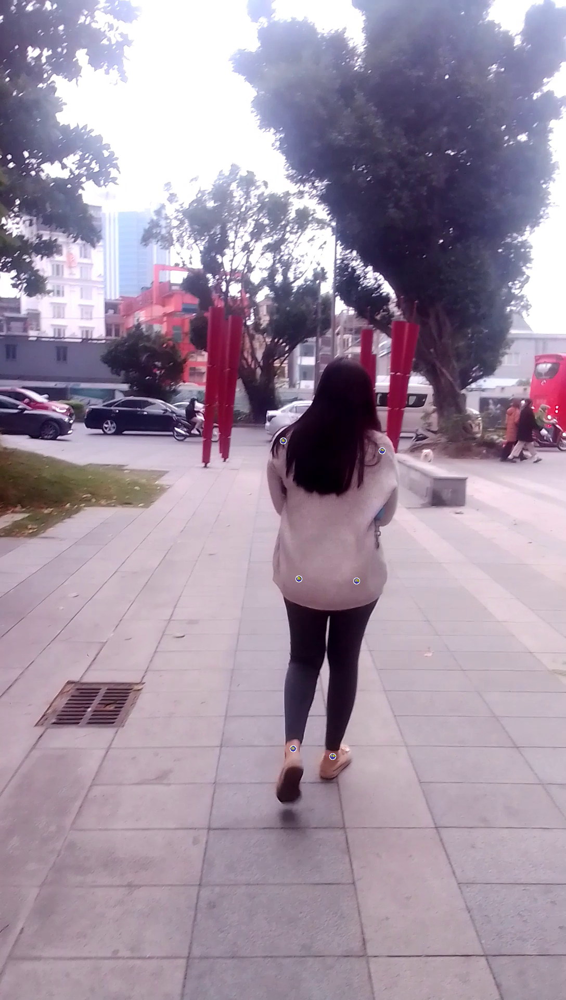

In [211]:
left_image, left_points = detect(left_sample)
print(left_points)
left_image

[[542.9865112304688, 815.3870849609375], [739.5494995117188, 818.263671875], [577.4208984375, 1081.4674072265625], [697.9412841796875, 1091.535400390625], [591.7686157226562, 1518.7021484375], [674.9850463867188, 1397.88720703125]]


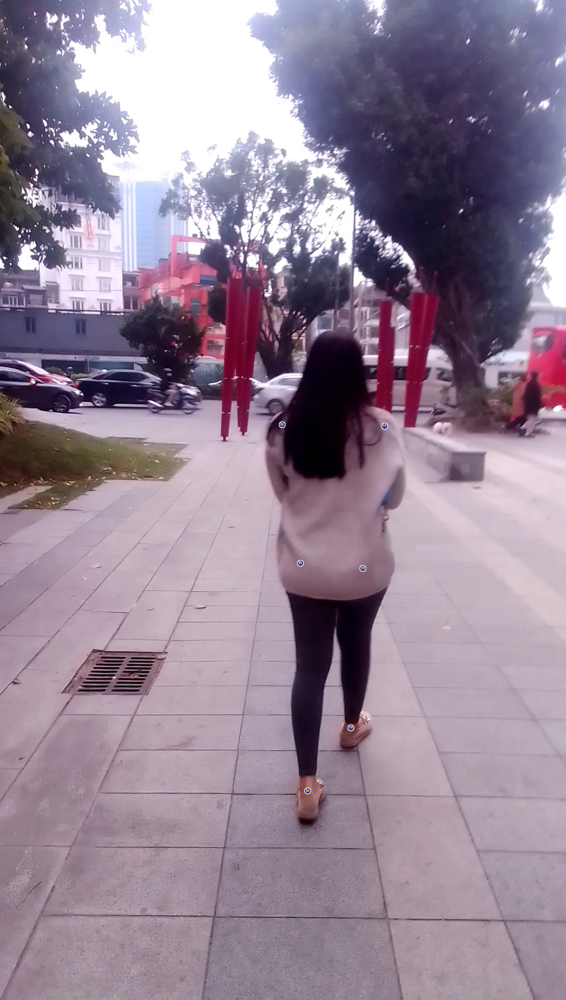

In [212]:
right_image, right_points = detect(right_sample)
print(right_points)
right_image

In [213]:
### Run Segmentation Model on Sample
### Load Human Segmentation Model
from torchvision.models.detection import MaskRCNN_ResNet50_FPN_V2_Weights, maskrcnn_resnet50_fpn_v2

weights = MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1
model = maskrcnn_resnet50_fpn_v2(weights=weights)
transforms = weights.transforms()

model.eval().to("cpu")

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         

In [215]:
import torch
from torchvision.utils import draw_segmentation_masks
from torchvision.transforms.functional import to_pil_image, pil_to_tensor

def segment(frame):
    ### Run Predicion Model to find Mask
    input_image = transforms(frame)
    predictions = model([input_image.to("cpu")])
    masks = predictions[0]['masks']
    scores = predictions[0]['scores']
    
    top = torch.max(scores)
    idx = torch.where(scores==top)
    mask = torch.squeeze(masks[idx][0], dim=1)
    mask_image = to_pil_image(mask)
    
    ### Find the Minimum Pixel Threshold for Mask
    histogram = torch.histogram(mask, 100)
    dists = histogram.hist
    bins = histogram.bin_edges

    min_value = torch.min(dists)
    idx = torch.where(dists == min_value)
    threshold = bins[idx]
    bool_mask = mask > threshold
    
    return mask, mask_image, bool_mask

In [216]:
left_mask, left_mask_image, left_bool_mask = segment(left_sample)

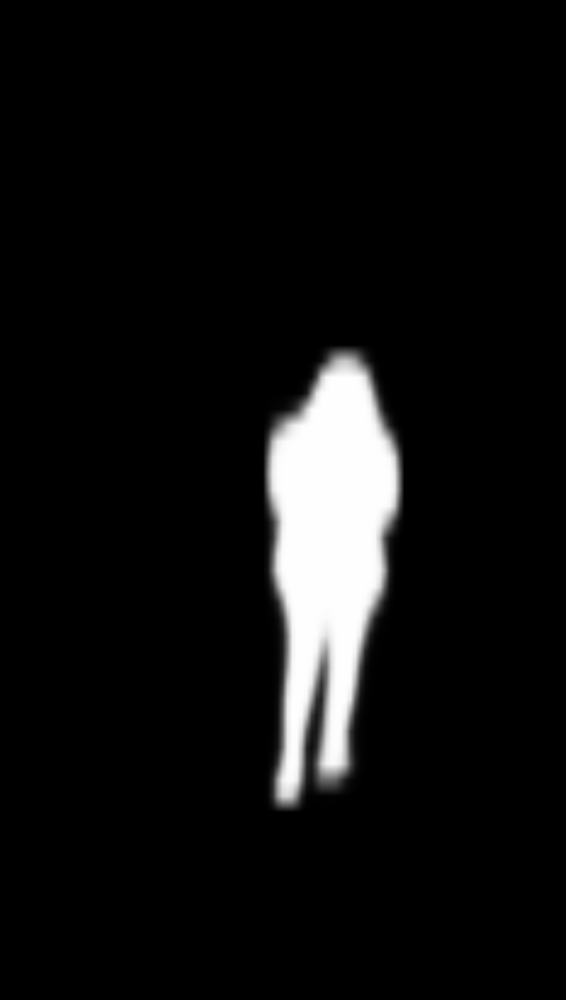

In [217]:
left_mask_image

In [218]:
print(left_mask)

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], grad_fn=<SqueezeBackward1>)


In [219]:
print(left_bool_mask)

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]])


In [220]:
### Tensor Image to Draw mask
tensor_image = pil_to_tensor(left_sample)
tensor_image

tensor([[[ 90,  90,  90,  ..., 253, 253, 253],
         [ 90,  90,  90,  ..., 253, 253, 253],
         [ 90,  90,  90,  ..., 253, 253, 253],
         ...,
         [166, 166, 166,  ..., 159, 159, 159],
         [168, 166, 166,  ..., 158, 158, 158],
         [168, 166, 166,  ..., 158, 158, 158]],

        [[ 79,  79,  79,  ..., 253, 253, 253],
         [ 79,  79,  79,  ..., 253, 253, 253],
         [ 79,  79,  79,  ..., 253, 253, 253],
         ...,
         [146, 146, 146,  ..., 143, 143, 143],
         [148, 146, 146,  ..., 142, 142, 142],
         [148, 146, 146,  ..., 142, 142, 142]],

        [[113, 113, 113,  ..., 253, 253, 253],
         [113, 113, 113,  ..., 253, 253, 253],
         [113, 113, 113,  ..., 253, 253, 253],
         ...,
         [158, 158, 158,  ..., 156, 156, 156],
         [160, 158, 158,  ..., 155, 155, 155],
         [160, 158, 158,  ..., 155, 155, 155]]], dtype=torch.uint8)

In [221]:
import collections
import math
import pathlib
import warnings
from itertools import repeat
from types import FunctionType
from typing import Any, BinaryIO, List, Optional, Tuple, Union

import numpy as np
import torch
from PIL import Image, ImageColor, ImageDraw, ImageFont

def draw_segment_masks(
    image: torch.Tensor,
    masks: torch.Tensor,
    alpha: float = 0.8,
    colors: Optional[Union[List[Union[str, Tuple[int, int, int]]], str, Tuple[int, int, int]]] = None,
) -> torch.Tensor:

    """
    Draws segmentation masks on given RGB image.
    The values of the input image should be uint8 between 0 and 255.

    Args:
        image (Tensor): Tensor of shape (3, H, W) and dtype uint8.
        masks (Tensor): Tensor of shape (num_masks, H, W) or (H, W) and dtype bool.
        alpha (float): Float number between 0 and 1 denoting the transparency of the masks.
            0 means full transparency, 1 means no transparency.
        colors (color or list of colors, optional): List containing the colors
            of the masks or single color for all masks. The color can be represented as
            PIL strings e.g. "red" or "#FF00FF", or as RGB tuples e.g. ``(240, 10, 157)``.
            By default, random colors are generated for each mask.

    Returns:
        img (Tensor[C, H, W]): Image Tensor, with segmentation masks drawn on top.
    """
    if not isinstance(image, torch.Tensor):
        raise TypeError(f"The image must be a tensor, got {type(image)}")
    elif image.dtype != torch.uint8:
        raise ValueError(f"The image dtype must be uint8, got {image.dtype}")
    elif image.dim() != 3:
        raise ValueError("Pass individual images, not batches")
    elif image.size()[0] != 3:
        raise ValueError("Pass an RGB image. Other Image formats are not supported")
    if masks.ndim == 2:
        masks = masks[None, :, :]
    if masks.ndim != 3:
        raise ValueError("masks must be of shape (H, W) or (batch_size, H, W)")
    if masks.dtype != torch.bool:
        raise ValueError(f"The masks must be of dtype bool. Got {masks.dtype}")
    if masks.shape[-2:] != image.shape[-2:]:
        raise ValueError("The image and the masks must have the same height and width")

    num_masks = masks.size()[0]
    if colors is not None and num_masks > len(colors):
        raise ValueError(f"There are more masks ({num_masks}) than colors ({len(colors)})")

    if num_masks == 0:
        warnings.warn("masks doesn't contain any mask. No mask was drawn")
        return image

    if colors is None:
        colors = _generate_color_palette(num_masks)

    if not isinstance(colors, list):
        colors = [colors]
    if not isinstance(colors[0], (tuple, str)):
        raise ValueError("colors must be a tuple or a string, or a list thereof")
    if isinstance(colors[0], tuple) and len(colors[0]) != 3:
        raise ValueError("It seems that you passed a tuple of colors instead of a list of colors")

    out_dtype = torch.uint8

    colors_ = []
    for color in colors:
        if isinstance(color, str):
            color = ImageColor.getrgb(color)
        colors_.append(torch.tensor(color, dtype=out_dtype))

    img_to_draw = image.detach().clone()
    # TODO: There might be a way to vectorize this
    for mask, color in zip(masks, colors_):
        print(mask, color)
        img_to_draw[:, mask] = color[:, None]

    out = image * (1 - alpha) + img_to_draw * alpha
    return out.to(out_dtype)

In [222]:
# from torchvision.utils import draw_segmentation_masks
from torchvision.transforms.functional import pil_to_tensor

left_tensor_image = pil_to_tensor(left_image)
left_mask_image = draw_segment_masks(left_tensor_image, left_bool_mask, alpha=0.3, colors=["blue"])
left_segment_keypoints = to_pil_image(left_mask_image)

tensor([[False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        ...,
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False]]) tensor([  0,   0, 255], dtype=torch.uint8)


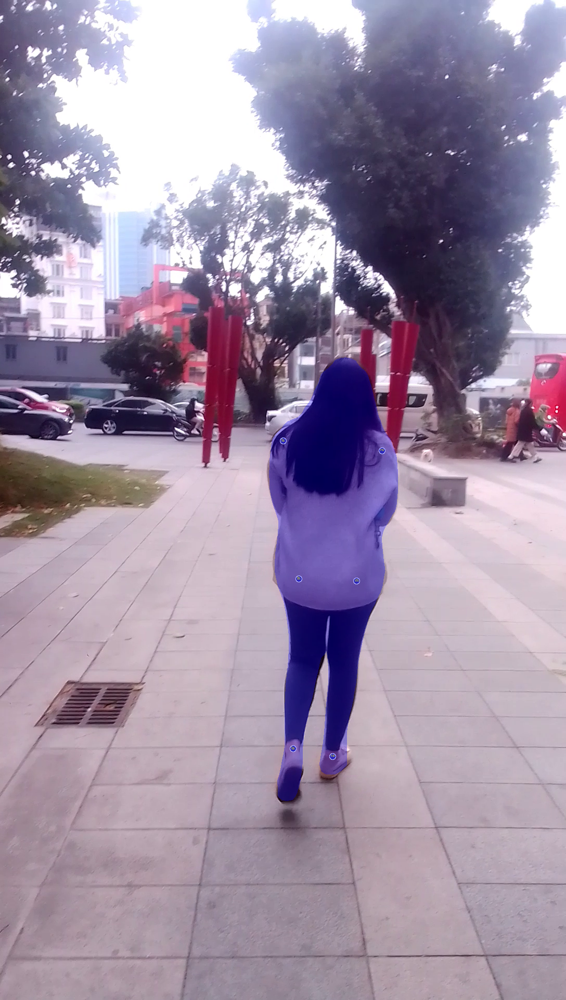

In [223]:
left_segment_keypoints

In [224]:
img_to_draw = tensor_image.detach().clone()
img_to_draw

tensor([[[ 90,  90,  90,  ..., 253, 253, 253],
         [ 90,  90,  90,  ..., 253, 253, 253],
         [ 90,  90,  90,  ..., 253, 253, 253],
         ...,
         [166, 166, 166,  ..., 159, 159, 159],
         [168, 166, 166,  ..., 158, 158, 158],
         [168, 166, 166,  ..., 158, 158, 158]],

        [[ 79,  79,  79,  ..., 253, 253, 253],
         [ 79,  79,  79,  ..., 253, 253, 253],
         [ 79,  79,  79,  ..., 253, 253, 253],
         ...,
         [146, 146, 146,  ..., 143, 143, 143],
         [148, 146, 146,  ..., 142, 142, 142],
         [148, 146, 146,  ..., 142, 142, 142]],

        [[113, 113, 113,  ..., 253, 253, 253],
         [113, 113, 113,  ..., 253, 253, 253],
         [113, 113, 113,  ..., 253, 253, 253],
         ...,
         [158, 158, 158,  ..., 156, 156, 156],
         [160, 158, 158,  ..., 155, 155, 155],
         [160, 158, 158,  ..., 155, 155, 155]]], dtype=torch.uint8)

In [225]:
### Filter Tensor Image for Mask section and Add Colors to The Area
mask = torch.squeeze(left_bool_mask, 0)
mask

tensor([[False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        ...,
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False]])

In [226]:
img_to_draw[:, mask]

tensor([[115, 118, 119,  ...,  29,  29,  29],
        [ 88,  91,  91,  ...,  10,  10,  10],
        [114, 117, 120,  ...,  24,  24,  26]], dtype=torch.uint8)

In [227]:
from PIL import ImageColor

color = ImageColor.getrgb('blue')
tensor_color = torch.tensor(color, dtype=torch.uint8)

tensor_color[:, None]

tensor([[  0],
        [  0],
        [255]], dtype=torch.uint8)

In [228]:
img_to_draw[:, mask] = tensor_color[:, None]

In [229]:
img_to_draw.shape

torch.Size([3, 1920, 1088])

In [230]:
img_to_draw[0][0].shape

torch.Size([1088])

In [231]:
x, y = torch.where(
    (img_to_draw[2] == 255)
    &(img_to_draw[0] == 0)
    &(img_to_draw[1] == 0)
)

positions = []
for x, y in zip(x, y):
    positions.append([x.item(), y.item(), x.item()*y.item()])
    
positions[0]

[686, 662, 454132]

In [232]:
1280 * 720

921600

In [233]:
red_pixel = img_to_draw[0][0][0]
green_pixel = img_to_draw[1][0][0]
blue_pixel = img_to_draw[2][0][0]

print(red_pixel.item(), green_pixel.item(), blue_pixel.item())

90 79 113


In [234]:
img_to_draw.shape

torch.Size([3, 1920, 1088])

In [235]:
output = (tensor_image * (1-0.4) + img_to_draw * 0.4).to(torch.uint8)
output.shape

torch.Size([3, 1920, 1088])

In [236]:
segment_keypoints = to_pil_image(output.to(torch.uint8))

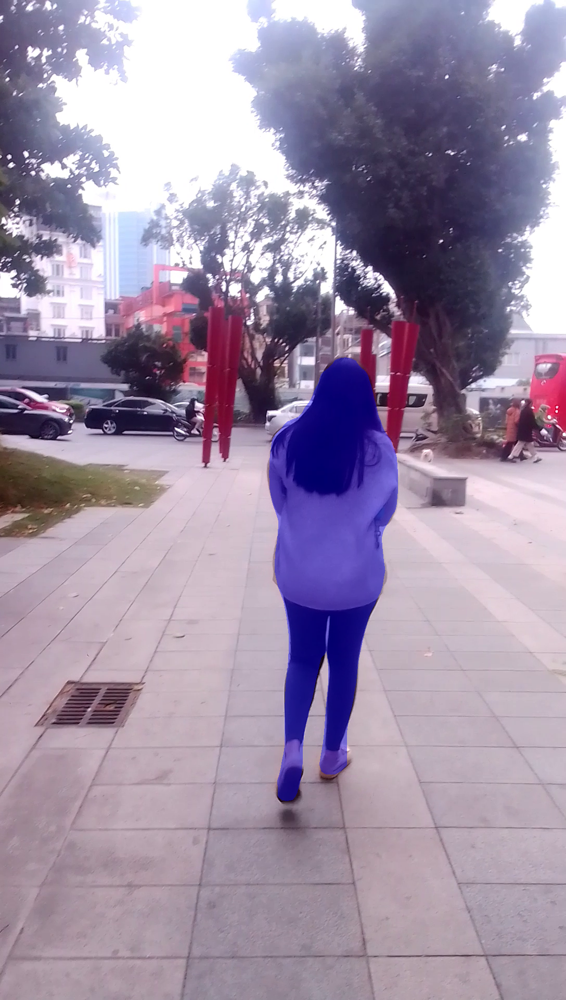

In [237]:
segment_keypoints

In [238]:
ls, rs, lh, rh, la, ra = left_points

In [239]:
print(ls, rs)

[544.615478515625, 846.7192993164062] [734.6489868164062, 865.4146118164062]


In [240]:
def findIntersection(ls, rs):
    lsX = ls[0]
    lsY = ls[1]
    rsX = rs[0]
    rsY = rs[1]
    for idx, position in enumerate(positions):
        swing = .5
        if position[0] > (ls[1]-swing) and position[0] < (ls[1]+swing):
            lsY = position[0]
            if position[1] < lsX:
                lsX = position[1]

        if position[0] > (rs[1]-swing) and position[0] < (rs[1]+swing):
            rsY = position[0]
            if position[1] > rsX:
                rsX = position[1]

    lsXY = (lsX, lsY)
    rsXY = (rsX, rsY)
    print(lsXY, rsXY)
    return lsXY, rsXY 

lsXY, rsXY = findIntersection(ls,rs)

(522, 847) (758, 865)


In [241]:
lhXY, rhXY = findIntersection(lh, rh)

(531, 1111) (736, 1116)


In [242]:
laXY, raXY = findIntersection(la, ra)

(546, 1438) (666, 1452)


In [243]:
print(lhXY[0], rhXY[0])

531 736


In [244]:
import math
def twoPointsDistance(pointA, pointB):
    x_dif = (pointA[0] - pointB[0])
    y_dif = (pointA[1] - pointB[1])
    dif = math.sqrt(x_dif * x_dif + y_dif * y_dif)
    return dif

def findMiddle(pointA, pointB):
    middleX = (pointA[0] + pointB[0])/2
    middleY = (pointA[1] + pointB[1])/2
    return middleX, middleY   

In [245]:
middleHip = findMiddle(lh, rh)
middleShoulder = findMiddle(lsXY, rsXY)
middleAnkle = findMiddle(la, ra)

leftMiddleHip = twoPointsDistance(lhXY, middleHip)
rightMiddleHip = twoPointsDistance(rhXY, middleHip)

shoulderLength = twoPointsDistance(lsXY, rsXY)
backLength = twoPointsDistance(middleShoulder, middleHip)
legLength = twoPointsDistance(middleHip, middleAnkle)

if leftMiddleHip > rightMiddleHip * 1.2:
    hipLength = rightMiddleHip *2
    lhXY = (middleHip[0] - rightMiddleHip, middleHip[1])
    
elif rightMiddleHip > leftMiddleHip * 1.2:
    hipLength = leftMiddleHip *2
    rhXY = (middleHip[0] + rightMiddleHip, middleHip[1])
    
else:
    hipLength = leftMiddleHip + rightMiddleHip
    
print("Shoulder: ", shoulderLength, lsXY, rsXY)
print("Hip: ", hipLength, lhXY, rhXY)
print("Back: ", backLength)
print("Leg: ", legLength)

Shoulder:  236.6854452643846 (522, 847) (758, 865)
Hip:  205.06100737889665 (531, 1111) (736, 1116)
Back:  257.66962696762994
Leg:  332.7291115625084


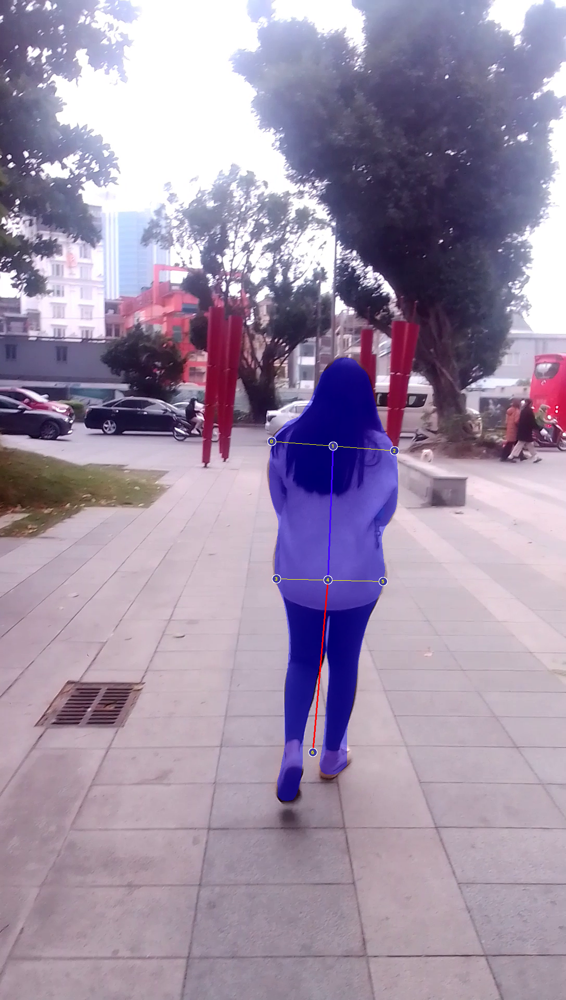

In [246]:
from PIL import ImageDraw

keypoints_font = ImageFont.truetype(font, 10)
copy = segment_keypoints.copy()
draw = ImageDraw.Draw(copy)

def drawLabel(label, point, radius):
    draw.ellipse(
            [(point[0]-radius, point[1]-radius), (point[0]+radius, point[1]+radius)],
            fill="#40389F",
            outline="#ffffff",
            width=1
        )

    draw.text(
        (point[0]-3, point[1]-6),
        str(label),
        fill="#FAFF00",
        font=keypoints_font,
        align="center"
    )

draw.line([lsXY, rsXY], fill='#FAFF00', width=1)
draw.line([lhXY, rhXY], fill='#FAFF00', width=1)
draw.line([middleShoulder, middleHip], fill='#4200FF', width=3)
draw.line([middleHip, middleAnkle], fill='#FF0000', width=3)
drawLabel("0",lsXY, 8)
drawLabel("1",middleShoulder, 8)
drawLabel("2",rsXY, 8)
drawLabel("3",lhXY, 8)
drawLabel("4",middleHip, 8)
drawLabel("5",rhXY, 8)
drawLabel("6",middleAnkle, 8)
copy

In [248]:
copy.save("sample_02_segment_keypoints_dec19.png")